# **Project Title : Cardiovascular Risk Prediction**


**Project type** - Classification

**Contribution** - Individual: **Rishi Anil Shah**

# **Problem Statement:**

* Cardiovascular diseases (CVDs) are the major cause of mortality worldwide. According to WHO, 17.9 million people died from CVDs in 2019, accounting for 32% of all global fatalities.
* Though CVDs cannot be treated, predicting the risk of the disease and taking the necessary precautions and medications can help to avoid severe symptoms and, in some cases, even death.
* As a result, it is critical that we accurately predict the risk of heart disease in order to avert as many fatalities as possible.

###**Github link:**
https://github.com/RishiAtWork1

# **Importing the libraries and the dataset:**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.metrics import roc_auc_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix as cm
from sklearn.metrics import ConfusionMatrixDisplay as cmd

from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb

import warnings
warnings.filterwarnings('ignore')

In [ ]:
#let's mount the google drive for import the dataset
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/DATA/data_cardiovascular_risk.csv')
df

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,0,64,2.0,F,YES,3.0,0.0,0,0,0,221.0,148.0,85.0,NaN,90.0,80.0,1
1,1,36,4.0,M,NO,0.0,0.0,0,1,0,212.0,168.0,98.0,29.77,72.0,75.0,0
2,2,46,1.0,F,YES,10.0,0.0,0,0,0,250.0,116.0,71.0,20.35,88.0,94.0,0
3,3,50,1.0,M,YES,20.0,0.0,0,1,0,233.0,158.0,88.0,28.26,68.0,94.0,1
4,4,64,1.0,F,YES,30.0,0.0,0,0,0,241.0,136.5,85.0,26.42,70.0,77.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3385,3385,60,1.0,F,NO,0.0,0.0,0,0,0,261.0,123.5,79.0,29.28,70.0,103.0,0
3386,3386,46,1.0,F,NO,0.0,0.0,0,0,0,199.0,102.0,56.0,21.96,80.0,84.0,0
3387,3387,44,3.0,M,YES,3.0,0.0,0,1,0,352.0,164.0,119.0,28.92,73.0,72.0,1
3388,3388,60,1.0,M,NO,0.0,NaN,0,1,0,191.0,167.0,105.0,23.01,80.0,85.0,0


# **Understand the Data:**

### **3.1. Variable Description:**

**Demographic:**
* Sex: male or female ("M" or "F")
* Age: Age of the patient (Continuous - Although the recorded ages have been truncated to whole numbers, the concept of age is continuous)
* Education: The level of education of the patient (categorical values - 1,2,3,4)

**Behavioral:**
* is_smoking: whether or not the patient is a current smoker ("YES" or "NO")
* Cigs Per Day: the number of cigarettes that the person smoked on average in one day.(can be considered continuous as one can have any number of cigarettes, even half a cigarette.)

**Medical (history):**
* BP Meds: whether or not the patient was on blood pressure medication (Nominal)
* Prevalent Stroke: whether or not the patient had previously had a stroke (Nominal)
* Prevalent Hyp: whether or not the patient was hypertensive (Nominal)
* Diabetes: whether or not the patient had diabetes (Nominal)

**Medical (current):**
* Tot Chol: total cholesterol level (Continuous)
* Sys BP: systolic blood pressure (Continuous)
* Dia BP: diastolic blood pressure (Continuous)
* BMI: Body Mass Index (Continuous)
* Heart Rate: heart rate (Continuous - In medical research, variables such as heart rate though in fact discrete, yet are considered continuous because of large number of possible values.)
* Glucose: glucose level (Continuous)

**Predict variable (desired target):**
* 10-year risk of coronary heart disease CHD(binary: “1”, means “Yes”, “0” means “No”)

In [ ]:
#Getting the shape of dataset with rows and columns
df.shape

(3390, 17)

In [ ]:
#information about null value in dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3390 entries, 0 to 3389
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               3390 non-null   int64  
 1   age              3390 non-null   int64  
 2   education        3303 non-null   float64
 3   sex              3390 non-null   object 
 4   is_smoking       3390 non-null   object 
 5   cigsPerDay       3368 non-null   float64
 6   BPMeds           3346 non-null   float64
 7   prevalentStroke  3390 non-null   int64  
 8   prevalentHyp     3390 non-null   int64  
 9   diabetes         3390 non-null   int64  
 10  totChol          3352 non-null   float64
 11  sysBP            3390 non-null   float64
 12  diaBP            3390 non-null   float64
 13  BMI              3376 non-null   float64
 14  heartRate        3389 non-null   float64
 15  glucose          3086 non-null   float64
 16  TenYearCHD       3390 non-null   int64  
dtypes: float64(9),

In [ ]:
df.columns

Index(['id', 'age', 'education', 'sex', 'is_smoking', 'cigsPerDay', 'BPMeds',
       'prevalentStroke', 'prevalentHyp', 'diabetes', 'totChol', 'sysBP',
       'diaBP', 'BMI', 'heartRate', 'glucose', 'TenYearCHD'],
      dtype='object')

In [ ]:
# Dropping the id column
df.drop(columns=['id'], inplace=True)

In [ ]:
df.rename(columns={'cigsPerDay':'cigs_per_day','BPMeds':'bp_meds',
                   'prevalentStroke':'prevalent_stroke','prevalentHyp':'prevalent_hyp',
                   'totChol':'total_cholesterol','sysBP':'systolic_bp','diaBP':'diastolic_bp',
                   'BMI':'bmi','heartRate':'heart_rate','TenYearCHD':'ten_year_chd'},
          inplace = True)

In [ ]:
#print the unique value
df.nunique()

age                    39
education               4
sex                     2
is_smoking              2
cigs_per_day           32
bp_meds                 2
prevalent_stroke        2
prevalent_hyp           2
diabetes                2
total_cholesterol     240
systolic_bp           226
diastolic_bp          142
bmi                  1259
heart_rate             68
glucose               132
ten_year_chd            2
dtype: int64

In [ ]:
#checking null values count
df.isnull().sum()

age                    0
education             87
sex                    0
is_smoking             0
cigs_per_day          22
bp_meds               44
prevalent_stroke       0
prevalent_hyp          0
diabetes               0
total_cholesterol     38
systolic_bp            0
diastolic_bp           0
bmi                   14
heart_rate             1
glucose              304
ten_year_chd           0
dtype: int64

In [ ]:

# Defining 3 lists containing the column names of
# a. dependent variables
# b. continuous independent variables
# c. categorical independent variables
# This is defined based on the number of unique values for each attribute

dependent_var = ['ten_year_chd']
continuous_var = ['age','cigs_per_day','total_cholesterol','systolic_bp', 'diastolic_bp', 'bmi', 'heart_rate', 'glucose']
categorical_var = ['education', 'sex', 'is_smoking','bp_meds','prevalent_stroke', 'prevalent_hyp', 'diabetes']

In [ ]:
#Changing the data type
for i in categorical_var:
    df[i] = df[i].astype('category')

In [ ]:
#Describing the Integer datatype
df[continuous_var].describe().round(2)

,age,cigs_per_day,total_cholesterol,systolic_bp,diastolic_bp,bmi,heart_rate,glucose
count,3390.00,3368.00,3352.00,3390.00,3390.00,3376.00,3389.00,3086.00
mean,49.54,9.07,237.07,132.60,82.88,25.79,75.98,82.09
std,8.59,11.88,45.25,22.29,12.02,4.12,11.97,24.24
min,32.00,0.00,107.00,83.50,48.00,15.96,45.00,40.00
25%,42.00,0.00,206.00,117.00,74.50,23.02,68.00,71.00
50%,49.00,0.00,234.00,128.50,82.00,25.38,75.00,78.00
75%,56.00,20.00,264.00,144.00,90.00,28.04,83.00,87.00
max,70.00,70.00,696.00,295.00,142.50,56.80,143.00,394.00


In [ ]:
#Describing Categorical datatype
df.describe(include='category')

,education,sex,is_smoking,bp_meds,prevalent_stroke,prevalent_hyp,diabetes
count,3303.0,3390,3390,3346.0,3390,3390,3390
unique,4.0,2,2,2.0,2,2,2
top,1.0,F,NO,0.0,0,0,0
freq,1391.0,1923,1703,3246.0,3368,2321,3303


In [ ]:
# Encoding the binary columns
df['sex'] = np.where(df['sex'] == 'M',1,0)
df['is_smoking'] = np.where(df['is_smoking'] == 'YES',1,0)

In [ ]:

# Checking Duplicate Values
value=len(df[df.duplicated()])
print("The number of duplicate values in the data set is = ",value)

The number of duplicate values in the data set is =  0


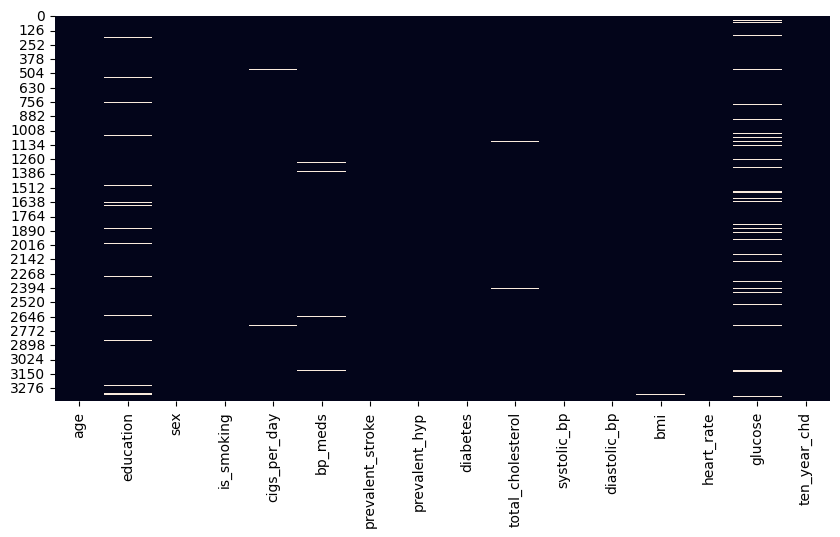

In [ ]:
# Visualizing the missing values
# Checking Null Value by plotting Heatmap
plt.figure(figsize=(10,5))
sns.heatmap(df.isnull(), cbar=False);

* The dataset is from an ongoing cardiovascular study on residents of the town of Framingham, Massachusetts. The classification goal is to predict whether the patient has a 10-year risk of future coronary heart disease (CHD).
* The dataset provides the patients’ information. Each attribute is a potential risk factor. There are demographic, behavioral, and medical risk factors.
* **The dataset contains 3390 rows and 16 columns. There are no duplicate records, and contains 510 missing values.**

# **Handling missing data:**

**Different ways of handling missing data:**
* Filling the missing data with the mean or median value if it’s a numerical variable.
* Filling the missing data with mode if it’s a categorical value.

In [ ]:
# Missing data counts and percentage
missing = df.columns[df.isnull().any()].tolist()
print(missing)
print('Missing Data Count')
print(df[missing].isnull().sum().sort_values(ascending = False))
print('--'*12)
print('Missing Data Percentage')
print(round(df[missing].isnull().sum().sort_values(ascending = False)/len(df)*100,2))

['education', 'cigs_per_day', 'bp_meds', 'total_cholesterol', 'bmi', 'heart_rate', 'glucose']
Missing Data Count
glucose              304
education             87
bp_meds               44
total_cholesterol     38
cigs_per_day          22
bmi                   14
heart_rate             1
dtype: int64
------------------------
Missing Data Percentage
glucose              8.97
education            2.57
bp_meds              1.30
total_cholesterol    1.12
cigs_per_day         0.65
bmi                  0.41
heart_rate           0.03
dtype: float64


Since, cigs_per_day, bmi, heart_rate has less percentage of null values. so we will drow that rows which are null.

In [ ]:
#dropping the rows which have less percentage of null values
for i in ['bmi', 'heart_rate']:
  df[i].dropna()

In [ ]:
# Replacing null values of categorical data with the mode
for col in ['education','bp_meds']:
  df[col] = df[col].fillna(df[col].mode()[0])

In [ ]:
# All missing values in the cigs_per_day column
df[(df['cigs_per_day'].isna()) & (df['is_smoking']==0)]

,age,education,sex,is_smoking,cigs_per_day,bp_meds,prevalent_stroke,prevalent_hyp,diabetes,total_cholesterol,systolic_bp,diastolic_bp,bmi,heart_rate,glucose,ten_year_chd


there is not one null value of cigs_per_day where petient is smoking. hence **we find that for every instance of missing values in cigs per day, the patients reported that they smoke.**.

In [ ]:
# mean and median number of cigarettes per day for a smoker (excluding non-smokers)
df[df['is_smoking']==1]['cigs_per_day'].mean(),df[df['is_smoking']==1]['cigs_per_day'].median()

(18.345945945945946, 20.0)

In [ ]:
# Imputing the missing values in the cigs_per_day
df['cigs_per_day'] = df['cigs_per_day'].fillna(df[df['is_smoking']==1]['cigs_per_day'].median())


In [ ]:
# Checking for any wrong entries where the patient is not a smoker
# and cigarettes per day above 0

df[(df['is_smoking']==0) & (df['cigs_per_day']>0)]

,age,education,sex,is_smoking,cigs_per_day,bp_meds,prevalent_stroke,prevalent_hyp,diabetes,total_cholesterol,systolic_bp,diastolic_bp,bmi,heart_rate,glucose,ten_year_chd


In [ ]:
# Checking for any wrong entries where the patient is a smoker
# and cigarettes per day is 0

df[(df['is_smoking']==1) & (df['cigs_per_day']==0)]

,age,education,sex,is_smoking,cigs_per_day,bp_meds,prevalent_stroke,prevalent_hyp,diabetes,total_cholesterol,systolic_bp,diastolic_bp,bmi,heart_rate,glucose,ten_year_chd


In [ ]:
# Replacing null values of  with the KNNImputer
# Using KNN imputer with K=10

imputer = KNNImputer(n_neighbors=10)
imputed = imputer.fit_transform(df)
df = pd.DataFrame(imputed, columns=df.columns)

In [ ]:
# checking for missing values
df.isna().sum().any()

False

**We have successfully handled all the missing values in the dataset.**

In [ ]:
#Getting the information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3390 entries, 0 to 3389
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   age                3390 non-null   float64
 1   education          3390 non-null   float64
 2   sex                3390 non-null   float64
 3   is_smoking         3390 non-null   float64
 4   cigs_per_day       3390 non-null   float64
 5   bp_meds            3390 non-null   float64
 6   prevalent_stroke   3390 non-null   float64
 7   prevalent_hyp      3390 non-null   float64
 8   diabetes           3390 non-null   float64
 9   total_cholesterol  3390 non-null   float64
 10  systolic_bp        3390 non-null   float64
 11  diastolic_bp       3390 non-null   float64
 12  bmi                3390 non-null   float64
 13  heart_rate         3390 non-null   float64
 14  glucose            3390 non-null   float64
 15  ten_year_chd       3390 non-null   float64
dtypes: float64(16)
memory us

Since, we have used KNNImputer, all features has converted into float data type.

In [ ]:
# changing datatypes
df = df.astype({'age': int, 'education':int,'sex':int,'is_smoking':int,'cigs_per_day':int,
               'bp_meds':int,'prevalent_stroke':int,'prevalent_hyp':int,'diabetes':int,
               'total_cholesterol':float,'systolic_bp':float,'diastolic_bp':float,
               'bmi':float,'heart_rate':float,'glucose':float,'ten_year_chd':int})

# **Exploratory Data Analysis:**

### **Distribution of the dependent variable:**

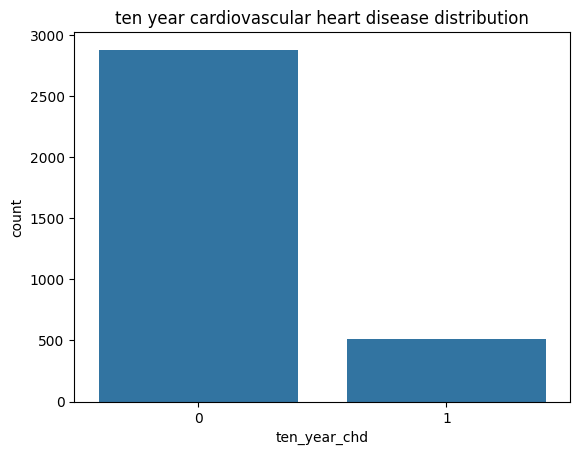

In [ ]:
#countplot of dependent variable
sns.countplot(x=df['ten_year_chd'])
plt.title('ten year cardiovascular heart disease distribution');

In [ ]:
#calculating value and percentage of ten year cardiovascular disease
chd_df = pd.DataFrame(df['ten_year_chd'].value_counts())
chd_df['Percentage'] = round(chd_df['ten_year_chd']*100/sum(chd_df['ten_year_chd']),3)
chd_df

,ten_year_chd,Percentage
0,2879,84.926
1,511,15.074


The dependent variable - 10-year risk of coronary heart disease is unbalanced. Only ~15% of the patients in the study were eventually exposed to the risk of this heart disease, rest of the patients were not exposed to this disease after the end of 10 year study.

### **Analyzing the distribution of the continuous independent variables:**

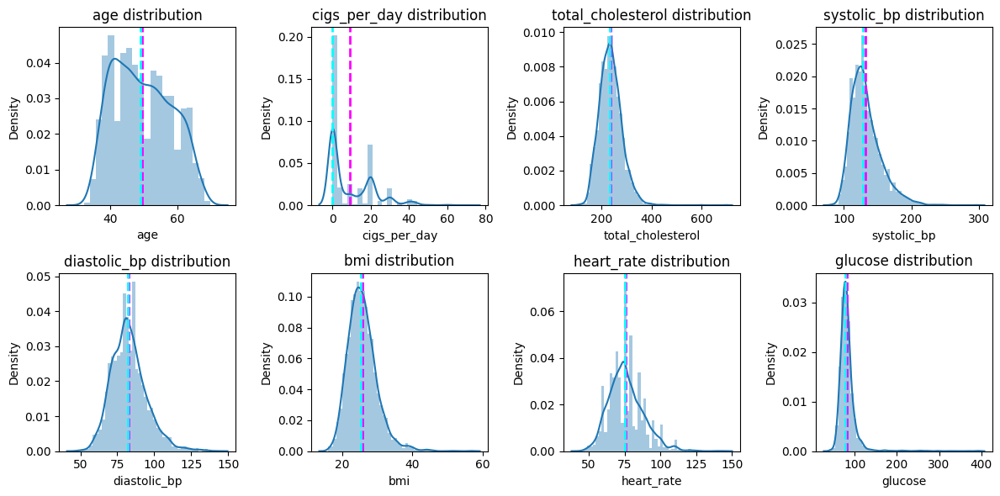

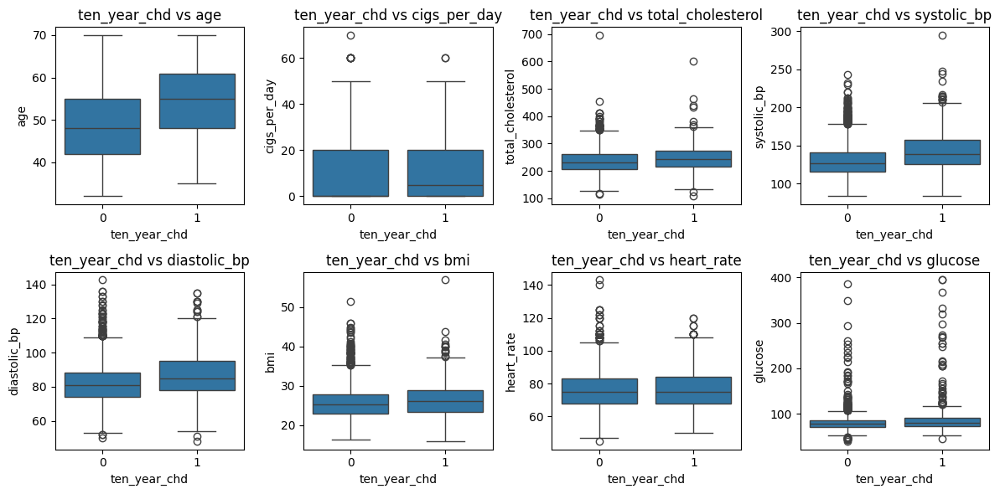

In [ ]:
# Checking Skewness
plt.figure(figsize=(12,6))
for n,col in enumerate(continuous_var):
  plt.subplot(2,4,n+1)
  sns.distplot(df[col])
  plt.axvline(df[col].mean(), color='magenta', linestyle='dashed', linewidth=2)
  plt.axvline(df[col].median(), color='cyan', linestyle='dashed', linewidth=2)
  plt.title(col+' distribution')
  plt.tight_layout();

#Checking Outliers
plt.figure(figsize=(12,6))
for n,col in enumerate(continuous_var):
  plt.subplot(2,4,n+1)
  # Relationship between pulse pressure with the dependent variable
  sns.boxplot(x='ten_year_chd',y=col,data=df)
  plt.title('ten_year_chd vs '+ col)
  plt.tight_layout();

**The distribution of several features is skewed, and contains outliers. We'll deal with the skew and outliers afterwards.**

###**The distribution of several features is skewed, and contains outliers. We'll deal with the skew afterwards.**

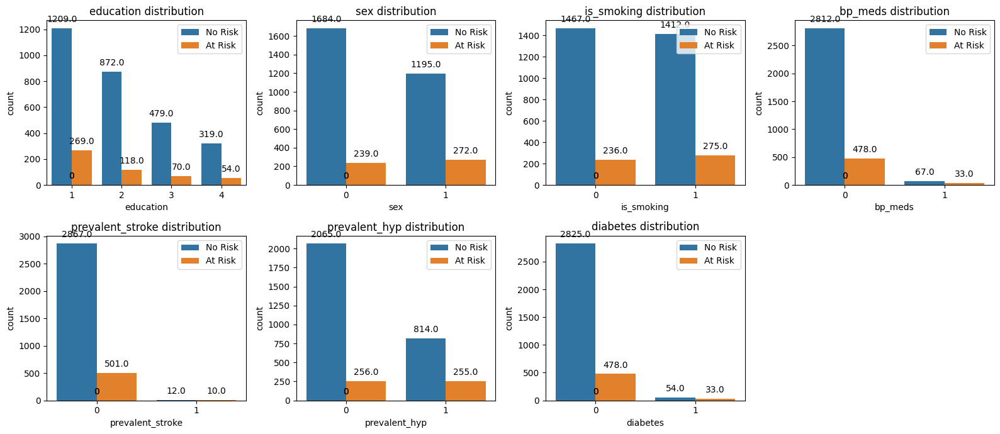

In [ ]:
# Analysing the distribution of categorical variables in the dataset

plt.figure(figsize=(16,7))
for n,i in enumerate(categorical_var):
  plt.subplot(2,4,n+1)
  p = sns.countplot(x = df[i],hue=df['ten_year_chd'])
  plt.xlabel(i)
  plt.title(i+' distribution')
  plt.legend(['No Risk','At Risk'])
  for i in p.patches:
    p.annotate(f'{i.get_height()}', (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
  plt.tight_layout();

###**Summary:**
* **Majority of the patients belong to the education level 1, followed by 2, 3, and 4 respectively.**
* **There are more female patients compared to male patients.**
* **Almost half the patients are smokers.**
* **100 patients under the study are undertaking blood pressure medication.**
* **22 patients under the study have experienced a stroke.**
* **1069 patients have hypertension.**
* **87 patients have diabetes.**

### **Analyzing the relationship between the dependent variable and the independent variables in the data:**

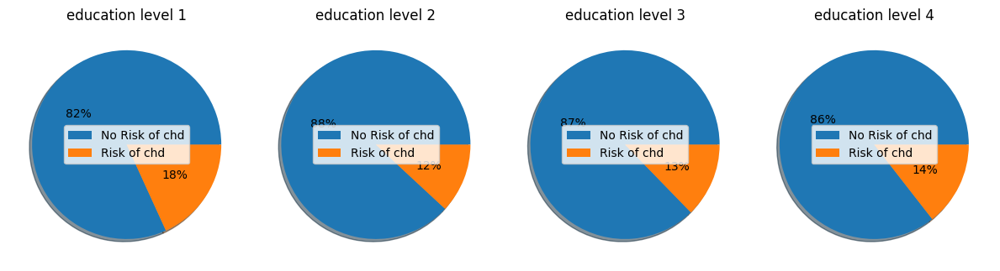

In [ ]:
#pie chart for education
plt.figure(figsize=(12,4))
for n,i in enumerate([1,2,3,4]):
  data0 = df[df['education']==i].groupby(['ten_year_chd']).count()['education']
  plt.subplot(1,4,n+1)
  # plotting data on chart
  plt.pie(data0, autopct='%.0f%%',shadow=True)
  plt.title(f'education level {i}')
  plt.legend(['No Risk of chd','Risk of chd'])
  plt.tight_layout();

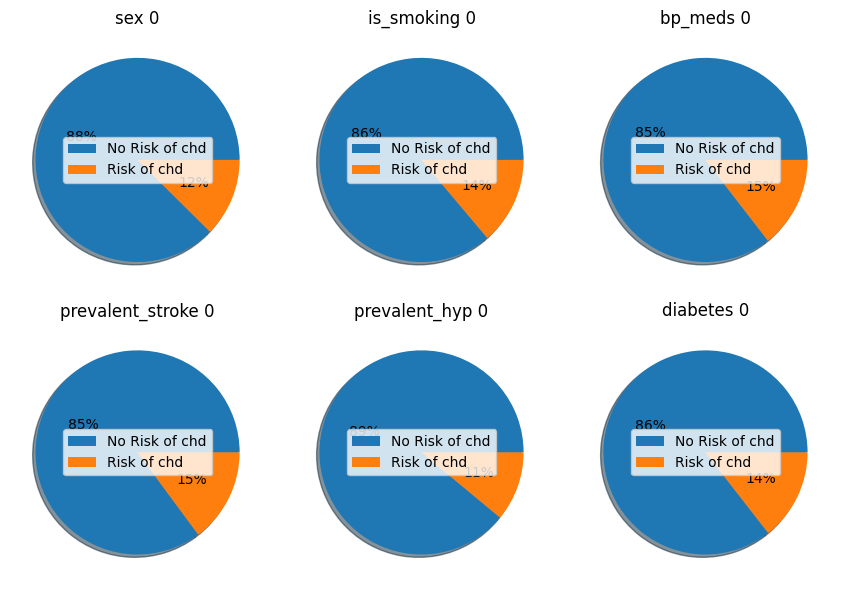

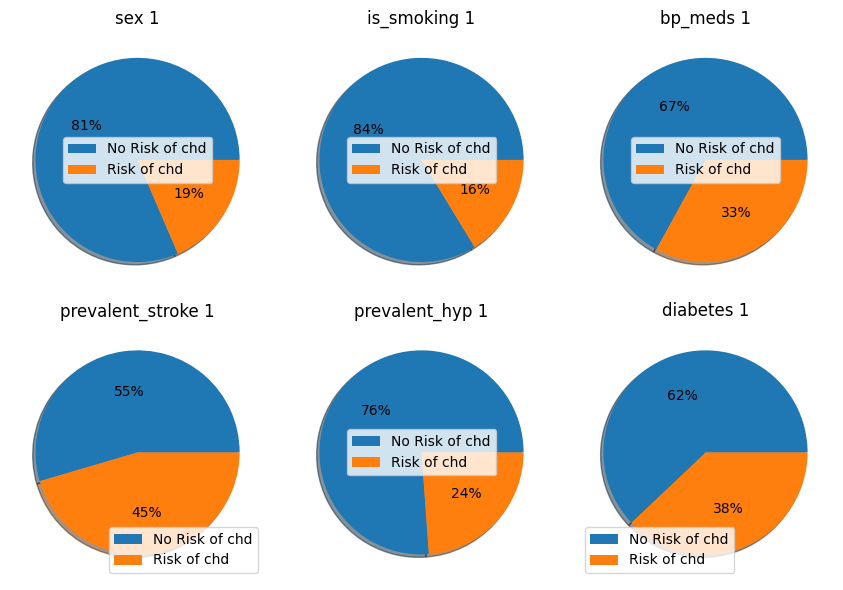

In [ ]:
#Using pie chart getting the percentage of different features on CVD's
categorical_var.remove('education')
# define Seaborn color palette to use
plt.figure(figsize=(9,6))
for n,i in enumerate(categorical_var):
  data0 = df[df[i]==0].groupby(['ten_year_chd']).count()[i]
  plt.subplot(2,3,n+1)
  # plotting data on chart
  plt.pie(data0, autopct='%.0f%%',shadow=True)
  plt.title(f'{i} 0')
  plt.legend(['No Risk of chd','Risk of chd'])
  plt.tight_layout();

plt.figure(figsize=(9,6))
for n,i in enumerate(categorical_var):
    data1 = df[df[i]==1].groupby(['ten_year_chd']).count()[i]
    plt.subplot(2,3,n+1)
    # plotting data on chart
    plt.pie(data1, autopct='%.0f%%',shadow=True)
    plt.title(f'{i} 1')
    plt.legend(['No Risk of chd','Risk of chd'])
    plt.tight_layout();



In [ ]:
#adding education in categorical variable
categorical_var.append('education')

Summary:
* **18%, 11%, 12%, 14% of the patients belonging to the education level 1, 2, 3, 4 respectively were eventually diagnosed with CHD.**
* **Male patients have significantly higher risk of CHD (18%) than female patients (12%)**
* **Patients who smoke have significantly higher risk of CHD (16%) than patients who don't smoke (13%)**
* **Patients who take BP medicines have significantly higher risk of CHD (33%) than other patients (14%)**
* **Patients who had experienced a stroke in their life have significantly higher risk of CHD (45%) than other patients (14%)**
* **Hypertensive patients have significantly higher risk of CHD (23%) than other patients (11%)**
* **Diabetic patients have significantly higher risk of CHD (37%) than other patients (14%)**

# **7. Data Preprocessing:**

## **Handling outliers in the data:**
- Imputing the median in total_cholesterol, cigs_per_day ,bmi, heart_rate which have IQR beyond range.

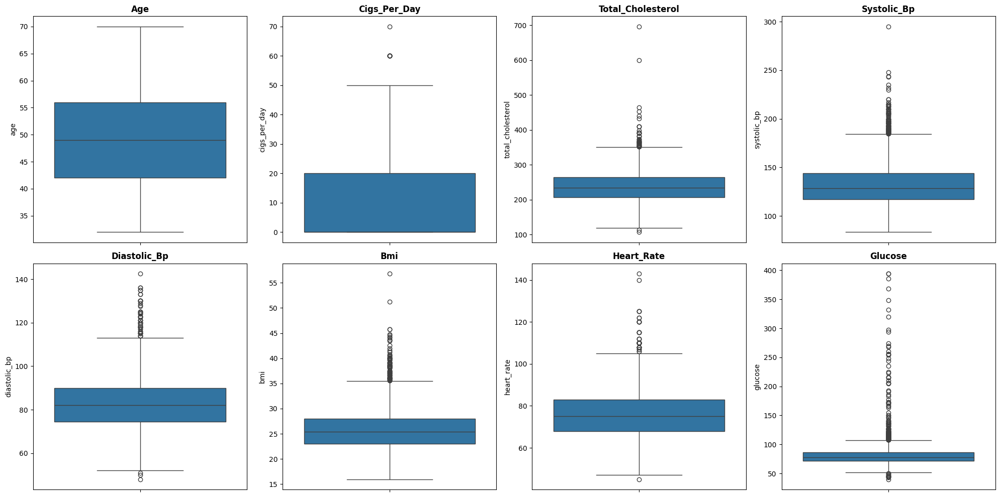

In [ ]:
# Visualization is the easiest way to have an inference about the overall data and the outliers.
plt.figure(figsize=(20,10))
for n,column in enumerate(continuous_var):
  plt.subplot(2, 4, n+1)
  sns.boxplot(df[column])
  plt.title(f'{column.title()}',weight='bold')
  plt.tight_layout();

### **Methods to treat outliers:**
* **Trimming/Remove the outliers:** In this technique, we remove the outliers from the dataset. Although it is not a good practice to follow.
* **Quantile based flooring and capping:** In this technique, the outlier is capped at a certain value above the 90th percentile value or floored at a factor below the 10th percentile value.
* **Mean/Median imputation:** As the mean value is highly influenced by the outliers, it is advised to replace the outliers with the median value.



In [ ]:
# Removing outliers by standard methods and Plotting graphs:
df = df.copy()
for col in continuous_var:
  # Using IQR method to define the range of inliners:
  q1, q3, median = df[col].quantile([0.25,0.75,0.5])
  lower_limit = q1 - 1.5*(q3-q1)
  upper_limit = q3 + 1.5*(q3-q1)

  # Replacing Outliers with median value
  df[col] = np.where(df[col] > upper_limit, median,np.where(
                         df[col] < lower_limit,median,df[col]))

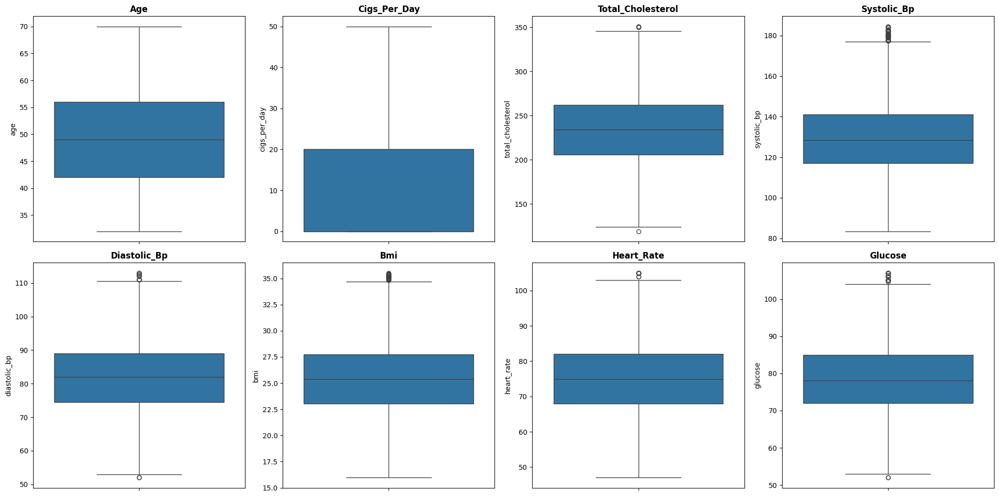

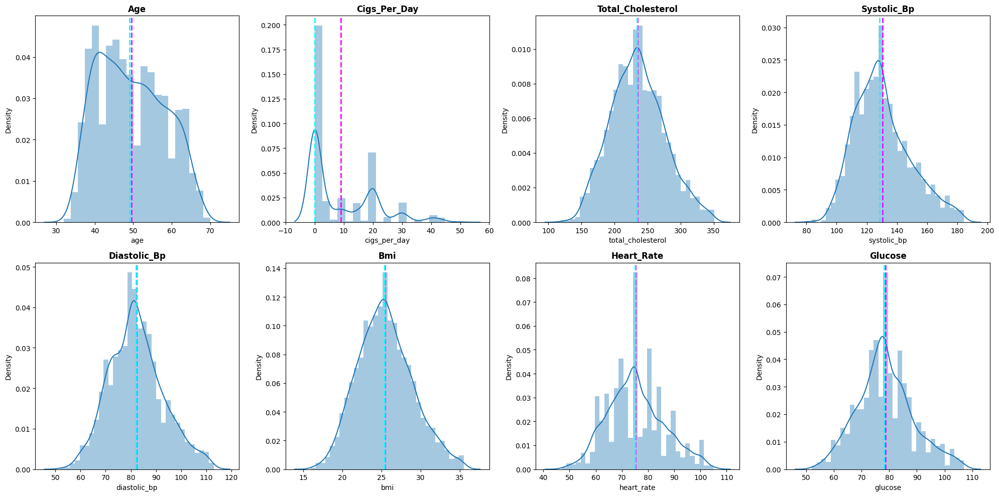

In [ ]:
# Visualization of after handling the outliers.
plt.figure(figsize=(20,10))
for n,column in enumerate(continuous_var):
  plt.subplot(2, 4, n+1)
  sns.boxplot(df[column])
  plt.title(f'{column.title()}',weight='bold')
  plt.tight_layout();

# Visualizing the distributions.
plt.figure(figsize=(20,10))
for n,column in enumerate(continuous_var):
  plt.subplot(2, 4, n+1)
  sns.distplot(df[column])
  plt.axvline(df[column].mean(), color='magenta', linestyle='dashed', linewidth=2)
  plt.axvline(df[column].median(), color='cyan', linestyle='dashed', linewidth=2)
  plt.title(f'{column.title()}',weight='bold')
  plt.tight_layout();

In [ ]:
#checking skewness of continuous variable
df[continuous_var].skew(axis = 0)

age                  0.225796
cigs_per_day         1.097163
total_cholesterol    0.234464
systolic_bp          0.590111
diastolic_bp         0.299948
bmi                  0.284140
heart_rate           0.287271
glucose              0.300101
dtype: float64

###**Method to treat Skewness:**
* **1.log transformation:** transform skewed distribution to a normal distribution.
* **2.Remove outliers**
* **3.Normalize (min-max)**
* **4.Cube root:** when values are too large. Can be applied on negative values.
* **5.Square root:** applied only to positive values.
* **6.Reciprocal**
* **7.Square: apply on left skew**
* **Skewness in target variable:** Use undersampling, oversampling or SMOTE

In [ ]:
#handling skewness of cigs_per_day
df['cigs_per_day'] = np.sqrt(df['cigs_per_day'])

In [ ]:
#checking skewness of continuous variable
df[continuous_var].skew(axis = 0)

age                  0.225796
cigs_per_day         0.449861
total_cholesterol    0.234464
systolic_bp          0.590111
diastolic_bp         0.299948
bmi                  0.284140
heart_rate           0.287271
glucose              0.300101
dtype: float64

## **Correlation analysis:**

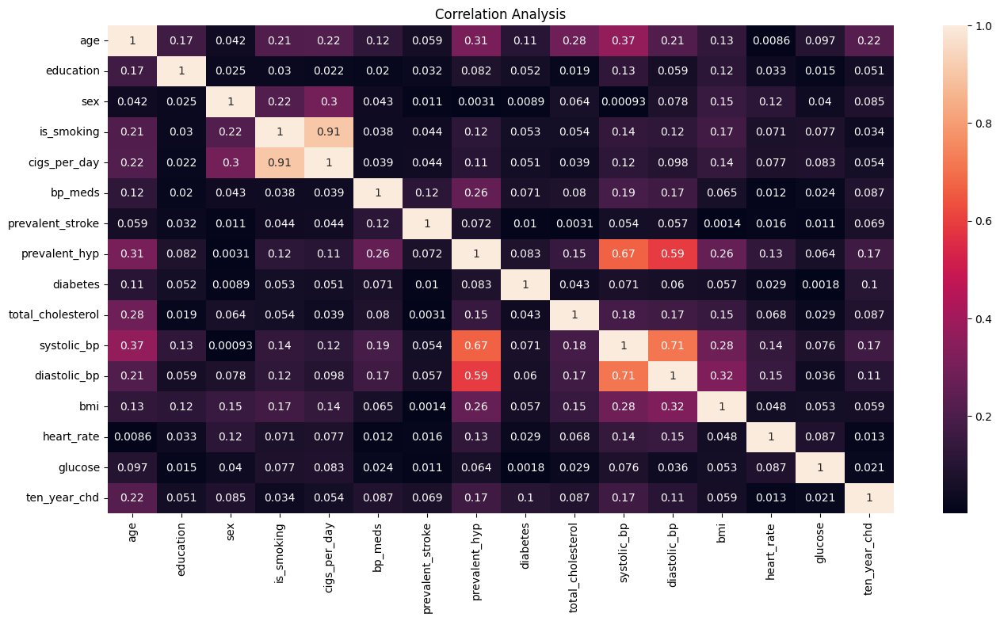

In [ ]:
# correlations
plt.figure(figsize=(16,8))
plt.title('Correlation Analysis')
correlation = df.corr()
sns.heatmap(abs(correlation), annot=True);

* **Above is the correlation magnitude heatmap for all the continuous variables in the dataset.**
* **The variables systolic BP and diastolic BP are highly correlated.**
* **The variables is_smoking and cigs_per_day are highly correlated.**
* **The variables diabetes and glucose are highly correlated.**
* **The variables systolic BP, diastolic BP and prevalent_hyp are highly correlated.**



In [ ]:
# and dropping systolic_bp, diastolic_bp and is_smoking column
df.drop('systolic_bp',axis=1,inplace=True)
df.drop('diastolic_bp',axis=1,inplace=True)

# Updating the continuous_var list
continuous_var.remove('systolic_bp')
continuous_var.remove('diastolic_bp')


In [ ]:
#dropping is_smoking column to avoid multicollenearity
df.drop(['is_smoking'],axis=1,inplace=True)

# Updating the categorical_var list
categorical_var.remove('is_smoking')

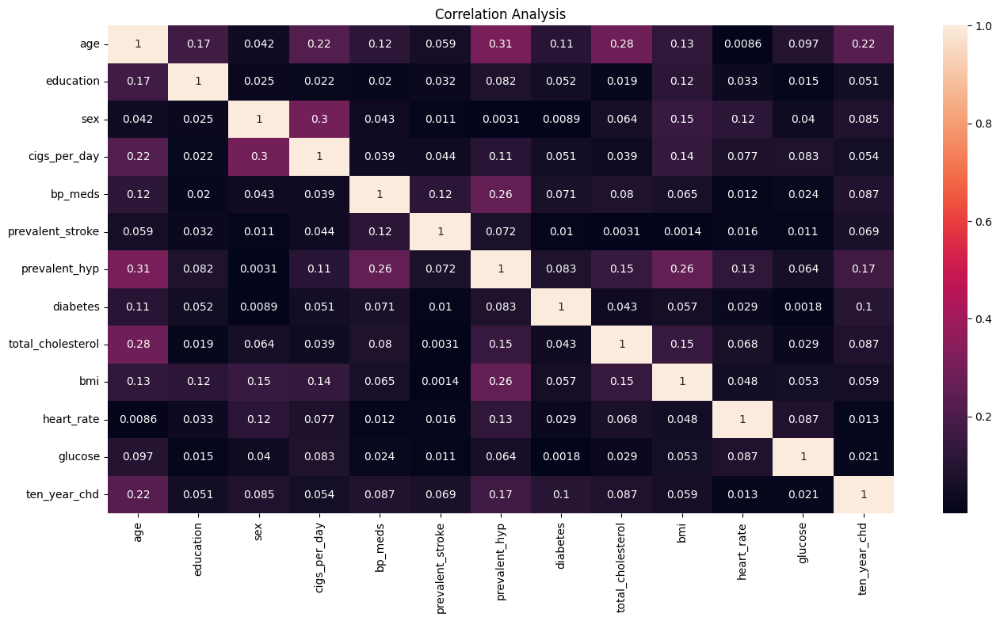

In [ ]:
# correlations
plt.figure(figsize=(16,8))
plt.title('Correlation Analysis')
correlation = df.corr()
sns.heatmap(abs(correlation), annot=True);

###**Checking VIF**

In [ ]:
# Defining a function to calculate Variance Inflation factor
def calc_vif(X):
    from statsmodels.stats.outliers_influence import variance_inflation_factor
    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif.sort_values(by='VIF',ascending=False).reset_index(drop=True))

In [ ]:
# Checking VIF for each variable
independent_variables = [i for i in df.columns if i not in ['TenYearCHD']]
VIF_Table = calc_vif(df[independent_variables])
VIF_Table

,variables,VIF
0,bmi,49.615657
1,glucose,49.443748
2,heart_rate,43.519364
3,age,39.157330
4,total_cholesterol,36.606563
5,education,4.577744
6,cigs_per_day,2.157492
7,sex,2.103342
8,prevalent_hyp,1.741876
9,ten_year_chd,1.281531


In [ ]:
# and dropping those columns which have high VIF
df.drop(['glucose'],axis=1,inplace=True)
# Updating the continuous_var list
continuous_var.remove('glucose')

In [ ]:
# Checking VIF for each variable
independent_variables = [i for i in df.columns if i not in ['TenYearCHD']]
VIF_Table = calc_vif(df[independent_variables])
VIF_Table

,variables,VIF
0,bmi,45.105927
1,heart_rate,38.261145
2,total_cholesterol,36.225973
3,age,35.926908
4,education,4.487184
5,cigs_per_day,2.156209
6,sex,2.103339
7,prevalent_hyp,1.722950
8,ten_year_chd,1.280135
9,bp_meds,1.127425


In [ ]:
df.head()

,age,education,sex,cigs_per_day,bp_meds,prevalent_stroke,prevalent_hyp,diabetes,total_cholesterol,bmi,heart_rate,ten_year_chd
0,64.0,2,0,1.732051,0,0,0,0,221.0,27.146,90.0,1
1,36.0,4,1,0.000000,0,0,1,0,212.0,29.770,72.0,0
2,46.0,1,0,3.162278,0,0,0,0,250.0,20.350,88.0,0
3,50.0,1,1,4.472136,0,0,1,0,233.0,28.260,68.0,1
4,64.0,1,0,5.477226,0,0,0,0,241.0,26.420,70.0,0


###**Spliting, resampling and Scaling the data**

In [ ]:
# Defining dependent and independent variables
x = df.drop('ten_year_chd',axis=1)
y = df['ten_year_chd']

In [ ]:
# train test split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42,stratify=y, shuffle=True)

In [ ]:
# Checking the train distribution of dependent variable
print(y_train.value_counts())

# Checking the test distribution of dependent variable
print(y_test.value_counts())

0    2303
1     409
Name: ten_year_chd, dtype: int64
0    576
1    102
Name: ten_year_chd, dtype: int64


In [ ]:
# Proportion of positive outcomes in train dataset
print(409/(409+2303))

# Proportion of positive outcomes in test dataset
print(102/(102+576))

0.15081120943952803
0.1504424778761062


**The train and test set contain almost equal proportion of results.**

## **Oversampling:**
* Since we are dealing with unbalanced data, ie, only ~15% of the patients were diagnosed with coronary heart disease, we will oversample the train dataset using SMOTE (Synthetic Minority Oversampling Technique).
* This ensures that the model has trained equally on all kinds of results, and it is not biased to one particular result.

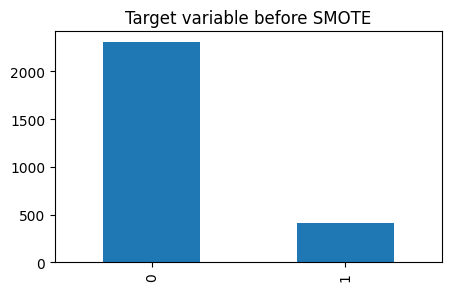

In [ ]:
# visualize the target variable before SMOTE
plt.figure(figsize=(5,3))
y_train.value_counts().plot(kind='bar', title='Target variable before SMOTE');

In [ ]:
# Oversampling using SMOTE
x_smote, y_smote = SMOTE(random_state=56).fit_resample(x_train, y_train)

# Checking Value counts for both classes Before and After handling Class Imbalance:
for col,label in [[y,"Before"],[y_smote,'After']]:
  print(label+' Handling Class Imbalace:')
  print(col.value_counts(),'\n')

Before Handling Class Imbalace:
0    2879
1     511
Name: ten_year_chd, dtype: int64 

After Handling Class Imbalace:
0    2303
1    2303
Name: ten_year_chd, dtype: int64 



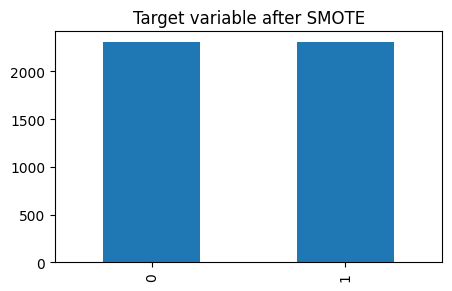

In [ ]:
# visualize the target variable after SMOTE
plt.figure(figsize=(5,3))
y_smote.value_counts().plot(kind='bar', title='Target variable after SMOTE');

**We have successfully oversampled the minority class using SMOTE. Now the model we build will be able to learn from both the classes without any bias.**

###**Scaling the data:**

In [ ]:
#features which has to be scaled
column_to_scale = continuous_var

In [ ]:
# Scaling data
scaler = StandardScaler()

x_smote[column_to_scale] = scaler.fit_transform(x_smote[column_to_scale])
x_test[column_to_scale] = scaler.transform(x_test[column_to_scale])

# Converting array to dataframe
x_smote_scaled = pd.DataFrame(x_smote,columns=x_train.columns)
x_test_scaled = pd.DataFrame(x_test,columns=x_test.columns)

In [ ]:
x_smote_scaled.head()

,age,education,sex,cigs_per_day,bp_meds,prevalent_stroke,prevalent_hyp,diabetes,total_cholesterol,bmi,heart_rate
0,-1.355151,2,0,-0.990480,0,0,0,0,-0.490540,-1.751099,-0.348788
1,-1.472353,2,0,1.082168,0,0,0,0,-0.807068,-1.745192,0.415828
2,-0.769145,3,1,1.940687,0,0,0,0,0.946006,-0.566635,-0.062057
3,-0.769145,4,0,-0.990480,0,0,0,0,-0.466192,-0.008371,-0.062057
4,-1.472353,2,1,1.082168,0,0,0,0,-0.660978,0.508540,1.084867


**We have successfully scaled down the variables using standard scaler.**

# **8. ML Model Implementation:**

##**Metric values of Classification**

####**Accuracy:**
* Accuracy simply measures how often the classifier correctly predicts. We can define accuracy as the ratio of the number of correct predictions and the total number of predictions.
    - Accuracy = (True Positive+True Negative)/(True Positive+True Negative+False Positive+False Negative)
####**Confusion Matrix:**
It is a table with combinations of predicted and actual values.
predictions and the total number of predictions.
####**Precision:**
* number of true positives divided by the number of predicted positives.
    - Precision = True Positive/(True Positive+ False Positive)
####**Recall (Sensitivity):**
* true positives divided by the total number of actual positives.
    - Recall = True Positive/(True Positive+ False Negative)
####**AUC-ROC:**
* The Receiver Operator Characteristic (ROC) is a probability curve that plots the TPR(True Positive Rate) against the FPR(False Positive Rate) at various threshold values and separates the ‘signal’ from the ‘noise’.
*  the greater the AUC, the better is the performance of the model at different threshold points between positive and negative classes.
* When AUC is equal to 1, the classifier is able to perfectly distinguish between all Positive and Negative class points. When AUC is equal to 0, the classifier would be predicting all Negatives as Positives and vice versa. When AUC is 0.5, the classifier is not able to distinguish between the Positive and Negative classes.

* Since the data we are dealing with is unbalanced, **accuracy may not be the best evaluation metric to evaluate the model performance**.
* Also, since we are dealing with data related to healthcare, **False Negatives are of higher concern than False Positive**
* In other words, it doesn’t matter whether we raise a false alarm but the actual positive cases should not go undetected
* Considering these points in mind, it is decided that we use **Recall** as the model evaluation metric.



In [ ]:
#function to get metric values
def model(model,x_train,y_train,x_test,y_test):
  # Train predictions
  train_pred = model.predict(x_train)

  # Test predictions
  test_pred = model.predict(x_test)

  # training set recall
  train_recall = recall_score(y_train,train_pred, average='binary')
  train_roc_auc_score = roc_auc_score(y_train, train_pred)
  train_f1_score = f1_score(y_train, train_pred, average=None)
  print('f1_score:',train_f1_score)
  # Test recall
  test_recall = recall_score(y_test,test_pred, average='binary')
  test_roc_auc_score = roc_auc_score(y_test, test_pred)
  test_f1_score = f1_score(y_test, test_pred, average=None)
  print('f1_score:',test_f1_score)

  data_set = [['recall',round((train_recall),3)],['roc_auc_score',round((train_roc_auc_score),3)]]
  training_df = pd.DataFrame(data_set, columns=['metrics','train_values'])

  data_set = [['recall',round((test_recall),3)],['roc_auc_score',round((test_roc_auc_score),3)]]
  testing_df = pd.DataFrame(data_set, columns=['metrics','test_values'])

  metric_values = training_df.merge(testing_df,how='inner', on='metrics')
  print(metric_values)

  plt.figure(figsize=(4,4))
  ax = metric_values.plot(kind='bar', x='metrics', rot=0)
  plt.title(model)
  ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
  plt.show();

  # Classification report
  print(classification_report(y_test,test_pred))

  # Confusion matrix
  from sklearn.metrics import confusion_matrix as cm
  from sklearn.metrics import ConfusionMatrixDisplay as cmd
  confusion_matrix = cm(y_test, test_pred)
  cm_display = cmd(confusion_matrix = confusion_matrix, display_labels = [False, True])


  #plt.rc('font', **font)

  cm_display.plot(cmap='Oranges')
  plt.title(f'Confusion matrix: {model}')
  plt.show();

  try:
    try:
      importance = model.feature_importances_
      feature = df.columns
    except:
      importance = np.abs(model.coef_)
      feature = independent_variables
    indices = np.argsort(importance)
    indices = indices[::-1]
  except:
    pass

  try:
    plt.figure(figsize=(18,3))
    plt.barh(range(len(indices)),importance[indices])
    plt.yticks(range(len(indices)), [feature[i] for i in indices])
    plt.title('Feature Importance')
    plt.tight_layout()
  except:
    pass
  plt.show()


## **Logistic Regression**

In [ ]:
# Fitting model
logistic_regression = LogisticRegression()

In [ ]:
# training the model
logistic_regression.fit(x_smote_scaled, y_smote)

LogisticRegression()

f1_score: [0.66814749 0.68280255]
f1_score: [0.78942214 0.35820896]
         metrics  train_values  test_values
0         recall         0.698        0.588
1  roc_auc_score         0.676        0.644


<Figure size 400x400 with 0 Axes>

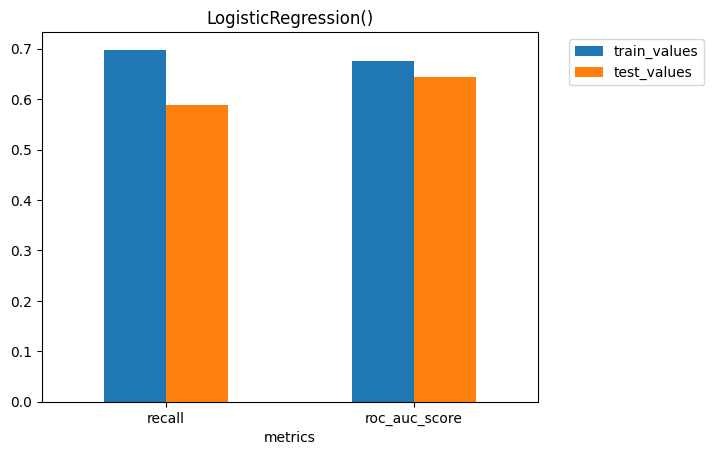

              precision    recall  f1-score   support

           0       0.91      0.70      0.79       576
           1       0.26      0.59      0.36       102

    accuracy                           0.68       678
   macro avg       0.58      0.64      0.57       678
weighted avg       0.81      0.68      0.72       678



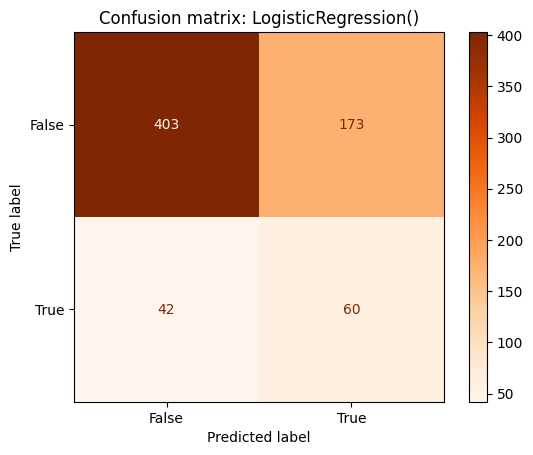

<Figure size 1800x300 with 0 Axes>

In [ ]:
#fitting the model
model(logistic_regression,x_smote_scaled,y_smote,x_test_scaled,y_test)

###**Important values of logistic regression:**
* **Recall score of train dataset : 70%**
* **Recall score of test dataset : 59%**
* **False Negatives : 42**
* **Important Features : bp_meds, age, cigs_per_day, sex, prevalent_stroke, education, diabetes, bmi**

## **K Nearest Neighbors:**

In [ ]:
# Value of k taken upto sqrt(n)
# Where n is no of records in the train dataset
# sqrt(4030) = 63.48
knn_test_res = []
knn_train_res = []
for k in range(1,80):
  knn_model = KNeighborsClassifier(n_neighbors=k)
  knn_model.fit(x_smote_scaled, y_smote)
  knn_train_pred = knn_model.predict(x_smote_scaled)
  knn_train_recall = recall_score(y_smote,knn_train_pred, average='binary')
  knn_test_pred = knn_model.predict(x_test_scaled)
  knn_test_recall = recall_score(y_test,knn_test_pred, average='binary')
  knn_test_res.append(knn_test_recall)
  knn_train_res.append(knn_train_recall)

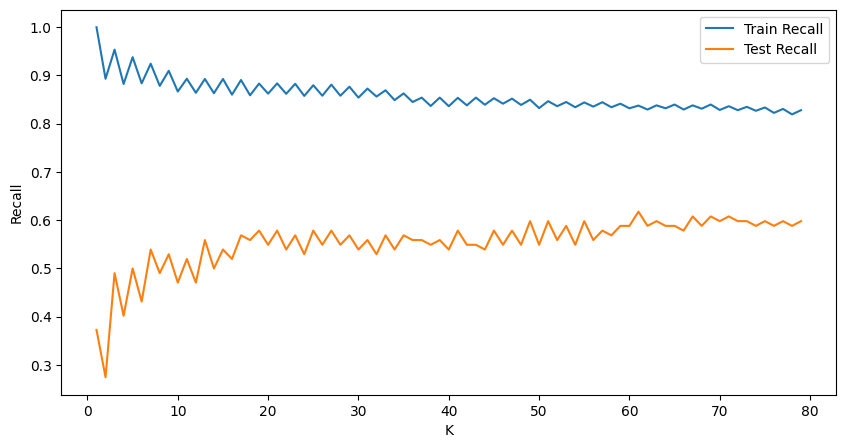

In [ ]:
# Plotting the train and test recalls for different values of k
plt.figure(figsize=(10,5))
x_ = range(1,80)
y1 = knn_train_res
y2 = knn_test_res
plt.plot(x_, y1, label='Train Recall')
plt.plot(x_, y2, label = 'Test Recall')
plt.xlabel('K')
plt.ylabel('Recall')
plt.legend()
plt.show()

In [ ]:
# Best k is where the test recall is the highest
best_k = knn_test_res.index(max(knn_test_res))+1
best_k

61

In [ ]:
# building knn model with best parameters
knn_model = KNeighborsClassifier(n_neighbors=best_k)

In [ ]:
# training the model
knn_model.fit(x_smote_scaled, y_smote)

KNeighborsClassifier(n_neighbors=61)

f1_score: [0.67311029 0.74521924]
f1_score: [0.74489796 0.33510638]
         metrics  train_values  test_values
0         recall         0.838        0.618
1  roc_auc_score         0.714        0.626


<Figure size 400x400 with 0 Axes>

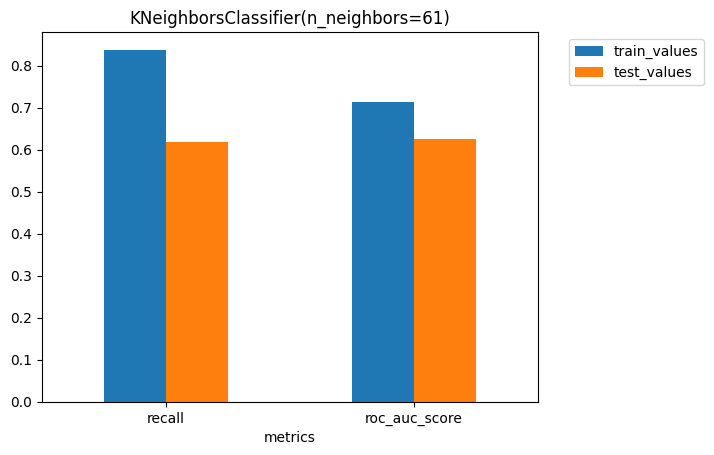

              precision    recall  f1-score   support

           0       0.90      0.63      0.74       576
           1       0.23      0.62      0.34       102

    accuracy                           0.63       678
   macro avg       0.57      0.63      0.54       678
weighted avg       0.80      0.63      0.68       678



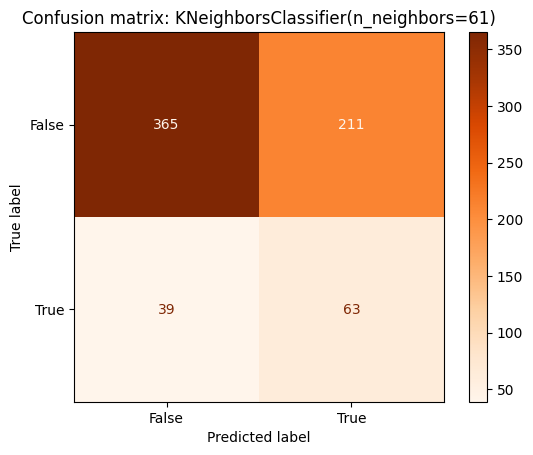

<Figure size 1800x300 with 0 Axes>

In [ ]:
#fitting the model
model(knn_model,x_smote_scaled,y_smote,x_test_scaled,y_test)

###**Important values of K nearest neighbors:**
* **Recall score of train dataset : 84%**
* **Recall score of test dataset : 62%**
* **False Negatives : 39**


## **Naive Bayes:**

In [ ]:
# Using stratified k fold cross validation so that each split
# has almost equal proportion of classification results
cv_method = RepeatedStratifiedKFold(n_splits=10,
                                    n_repeats=3,
                                    random_state=42)

# Fitting model
nb_model = GaussianNB()

In [ ]:
# Max depth of dt without hyperparameter tuning = 28 and min samples leaf = 1
nb_params = {'var_smoothing': np.logspace(0,-9, num=50)
             }

nb_gridsearch = GridSearchCV(nb_model,
                             nb_params,
                             cv=cv_method,
                             scoring= 'recall')
nb_gridsearch.fit(x_smote_scaled,y_smote)
nb_best_params = nb_gridsearch.best_params_

# model best parameters
nb_best_params

{'var_smoothing': 1.0985411419875572e-05}

In [ ]:
# building knn model with best parameters
nb_model = GaussianNB(var_smoothing=nb_best_params['var_smoothing'])

In [ ]:
# training the model
nb_model.fit(x_smote_scaled, y_smote)

GaussianNB(var_smoothing=1.0985411419875572e-05)

f1_score: [0.58086501 0.70372429]
f1_score: [0.66230937 0.29223744]
         metrics  train_values  test_values
0         recall         0.825        0.627
1  roc_auc_score         0.653        0.578


<Figure size 400x400 with 0 Axes>

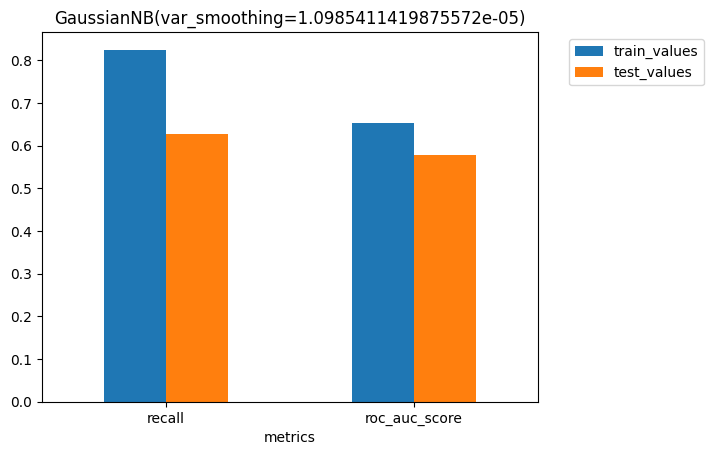

              precision    recall  f1-score   support

           0       0.89      0.53      0.66       576
           1       0.19      0.63      0.29       102

    accuracy                           0.54       678
   macro avg       0.54      0.58      0.48       678
weighted avg       0.78      0.54      0.61       678



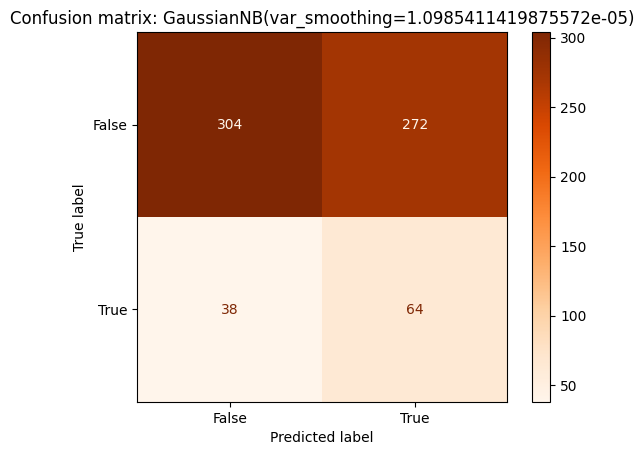

<Figure size 1800x300 with 0 Axes>

In [ ]:
#fitting the model
model(nb_model,x_smote_scaled,y_smote,x_test_scaled,y_test)

###**Important values of Naive Bayes:**
* **Recall score of train dataset : 83%**
* **Recall score of test dataset : 63%**
* **False Negatives : 38**


## **Decision tree with gridsearchcv:**

In [ ]:
# Max depth of dt without hyperparameter tuning = 28 and min samples leaf = 1
dt_model = DecisionTreeClassifier()
dt_params = {'max_depth':np.arange(1,10),
             'min_samples_split':np.arange(0.1,1,0.1),
             'min_samples_leaf':np.arange(0.1,0.6,0.1)
             }

In [ ]:
# using gridsearchcv to find best parameters
dt_gridsearch = GridSearchCV(dt_model,
                             dt_params,
                             cv=cv_method,
                             scoring= 'recall')
dt_gridsearch.fit(x_smote_scaled,y_smote)
dt_best_params = dt_gridsearch.best_params_

In [ ]:
# model best parameters
dt_best_params

{'max_depth': 1, 'min_samples_leaf': 0.1, 'min_samples_split': 0.1}

In [ ]:
# building knn model with best parameters
dt_model = DecisionTreeClassifier(max_depth=dt_best_params['max_depth'],
                                  min_samples_split=dt_best_params['min_samples_split'],
                                  min_samples_leaf=dt_best_params['min_samples_leaf'])

In [ ]:
# training the model
dt_model.fit(x_smote_scaled, y_smote)

DecisionTreeClassifier(max_depth=1, min_samples_leaf=0.1, min_samples_split=0.1)

f1_score: [0.55070912 0.69333333]
f1_score: [0.66591928 0.35775862]
         metrics  train_values  test_values
0         recall         0.824        0.814
1  roc_auc_score         0.635        0.665


<Figure size 400x400 with 0 Axes>

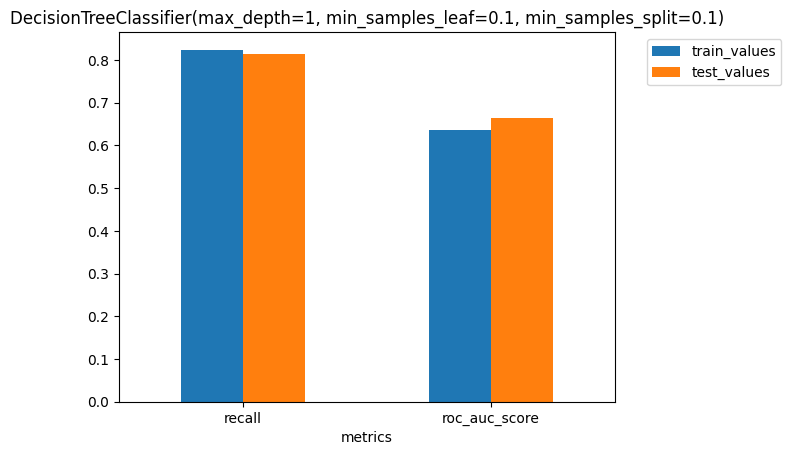

              precision    recall  f1-score   support

           0       0.94      0.52      0.67       576
           1       0.23      0.81      0.36       102

    accuracy                           0.56       678
   macro avg       0.58      0.66      0.51       678
weighted avg       0.83      0.56      0.62       678



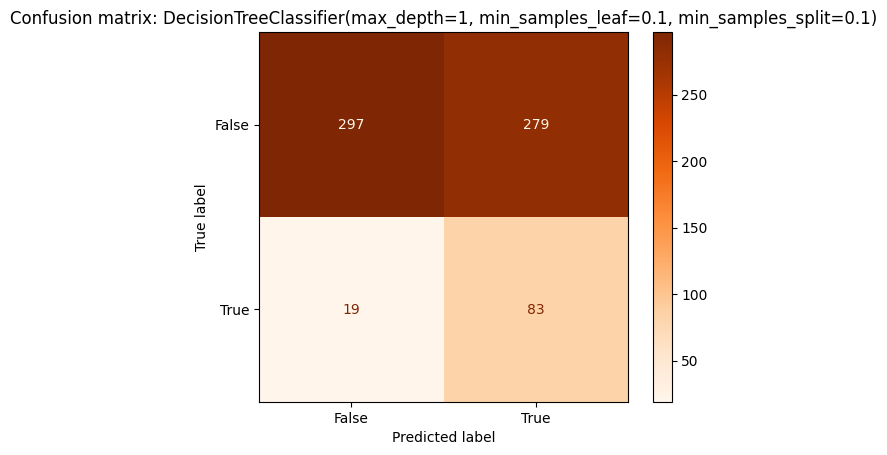

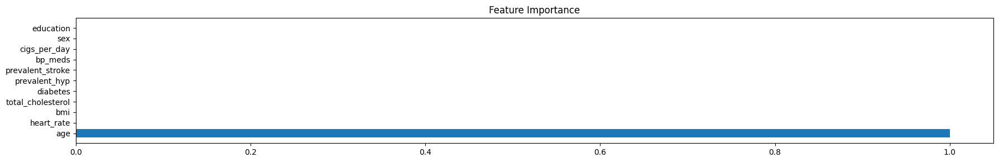

In [ ]:
#fitting the model
model(dt_model,x_smote_scaled,y_smote,x_test_scaled,y_test)

###**Important values of Decision tree with gridsearchcv:**
* **Recall score of train dataset : 82%**
* **Recall score of test dataset : 81%**
* **False Negatives : 19**
* **Important Features : age**

##**Support Vector Machine**

In [ ]:
# SVM model parameters
svm_model = SVC()
svm_params = {'C': [0.1, 1, 10],
              'gamma': [0.01, 0.001, 0.0001],
              'kernel': ['rbf']}

# Using gridsearchcv to find best parameters
svm_gridsearch = GridSearchCV(svm_model,
                              svm_params,
                              cv=cv_method,
                              scoring= 'recall')
svm_gridsearch.fit(x_smote_scaled,y_smote)
svm_best_params = svm_gridsearch.best_params_

# model best parameters
svm_best_params

{'C': 1, 'gamma': 0.0001, 'kernel': 'rbf'}

In [ ]:
# building knn model with best parameters
svm_model = SVC(C=svm_best_params['C'],
                gamma=svm_best_params['gamma'],
                kernel=svm_best_params['kernel'],probability=True)

# training the model
svm_model.fit(x_smote_scaled, y_smote)

SVC(C=1, gamma=0.0001, probability=True)

f1_score: [0.57097033 0.70663498]
f1_score: [0.66219239 0.34632035]
         metrics  train_values  test_values
0         recall         0.839        0.784
1  roc_auc_score         0.652        0.649


<Figure size 400x400 with 0 Axes>

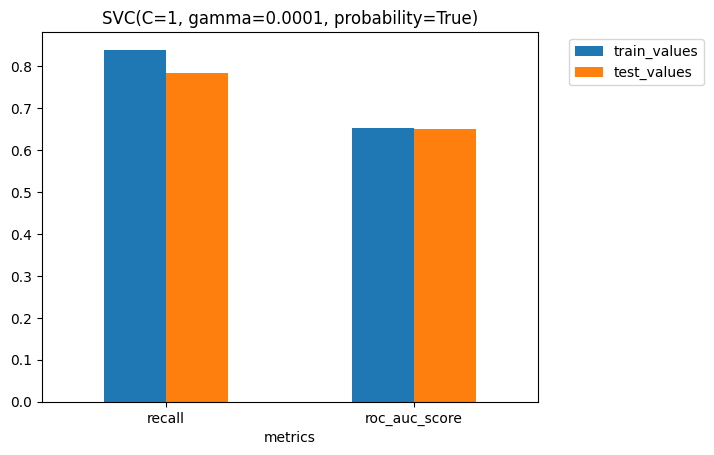

              precision    recall  f1-score   support

           0       0.93      0.51      0.66       576
           1       0.22      0.78      0.35       102

    accuracy                           0.55       678
   macro avg       0.58      0.65      0.50       678
weighted avg       0.82      0.55      0.61       678



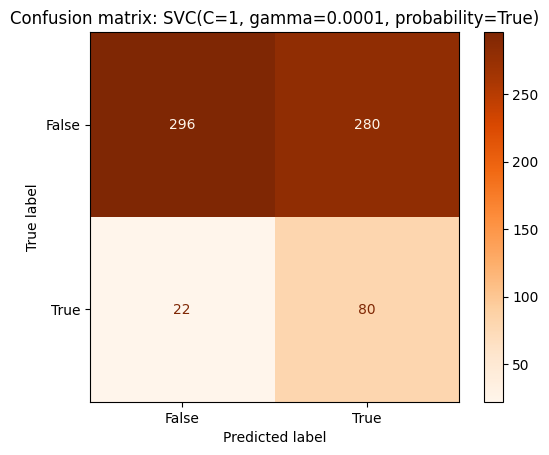

<Figure size 1800x300 with 0 Axes>

In [ ]:
#fitting the model
model(svm_model,x_smote_scaled,y_smote,x_test_scaled,y_test)

###**Important values of support vector machine:**
* **Recall score of train dataset : 84%**
* **Recall score of test dataset : 78%**
* **False Negatives : 22**

##**Random Forest with gridsearchcv**

In [ ]:
# random forest model
rf_model = RandomForestClassifier(random_state=0)

rf_params = {'n_estimators':[50],                    # limited due to computational power availability
             'max_depth':np.arange(3,6),
             'min_samples_split':np.arange(0.1,1,0.2),
             'min_samples_leaf':np.arange(0.1,0.6,0.1)}

In [ ]:
# using gridsearchcv to find best parameters
rf_gridsearch = GridSearchCV(rf_model,rf_params,cv=cv_method,scoring='recall')
rf_gridsearch.fit(x_smote_scaled, y_smote)
rf_best_params = rf_gridsearch.best_params_

# best parameters for random forests
rf_best_params

{'max_depth': 3,
 'min_samples_leaf': 0.1,
 'min_samples_split': 0.7000000000000001,
 'n_estimators': 50}

In [ ]:
# Fitting RF model with best parameters
rf_model = RandomForestClassifier(n_estimators=rf_best_params['n_estimators'],
                                  min_samples_leaf=rf_best_params['min_samples_leaf'],
                                  min_samples_split=rf_best_params['min_samples_split'],
                                  max_depth=rf_best_params['max_depth'],
                                  random_state=0)

In [ ]:
# fitting the model
rf_model.fit(x_smote_scaled, y_smote)

RandomForestClassifier(max_depth=3, min_samples_leaf=0.1,
                       min_samples_split=0.7000000000000001, n_estimators=50,
                       random_state=0)

f1_score: [0.         0.66666667]
f1_score: [0.         0.26153846]
         metrics  train_values  test_values
0         recall           1.0          1.0
1  roc_auc_score           0.5          0.5


<Figure size 400x400 with 0 Axes>

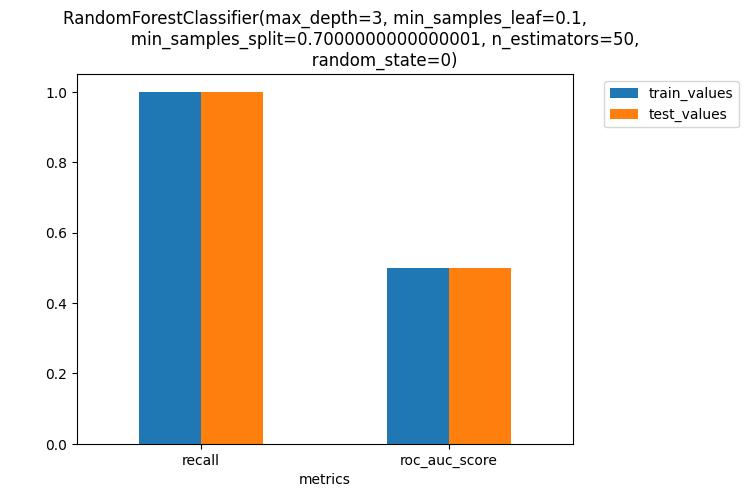

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       576
           1       0.15      1.00      0.26       102

    accuracy                           0.15       678
   macro avg       0.08      0.50      0.13       678
weighted avg       0.02      0.15      0.04       678



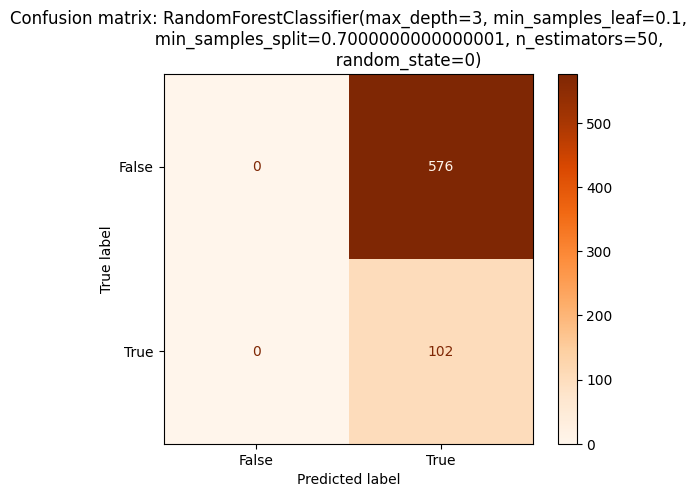

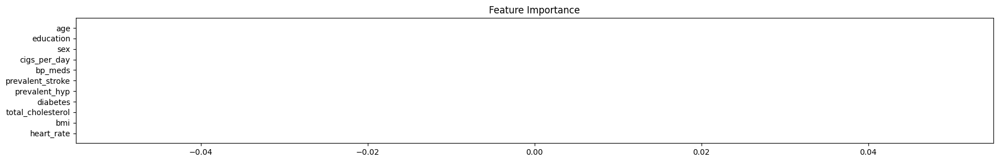

In [ ]:
#fitting the model
model(rf_model,x_smote_scaled,y_smote,x_test_scaled,y_test)

###**Important values of Random Forest with gridsearchcv:**
* **Recall score of train dataset : 100%**
* **Recall score of test dataset : 100%**
* **False Negatives : 0**


##**XgBoost Classifier**

In [ ]:
# Fitting xgb with best parameters
xgb_model = xgb.XGBClassifier(n_estimators=2, objective='binary:logistic',eta= 0.05,learning_rate=0.1, max_depth=1)

# fitting the model
xgb_model.fit(x_smote_scaled,y_smote)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.05, eval_metric=None,
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=1,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=2,
              n_jobs=None, num_parallel_tree=None, ...)

f1_score: [0.54997328 0.69213894]
f1_score: [0.66591928 0.35775862]
         metrics  train_values  test_values
0         recall         0.822        0.814
1  roc_auc_score         0.634        0.665


<Figure size 400x400 with 0 Axes>

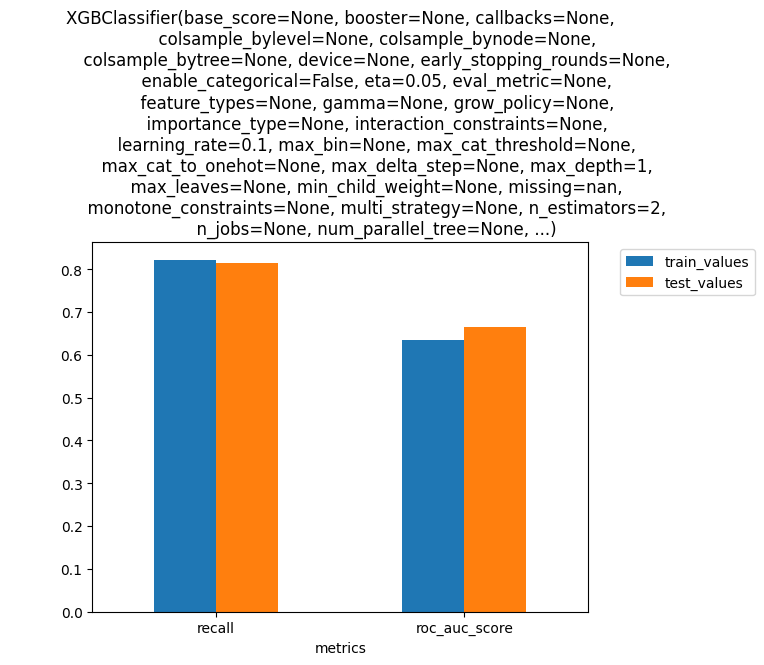

              precision    recall  f1-score   support

           0       0.94      0.52      0.67       576
           1       0.23      0.81      0.36       102

    accuracy                           0.56       678
   macro avg       0.58      0.66      0.51       678
weighted avg       0.83      0.56      0.62       678



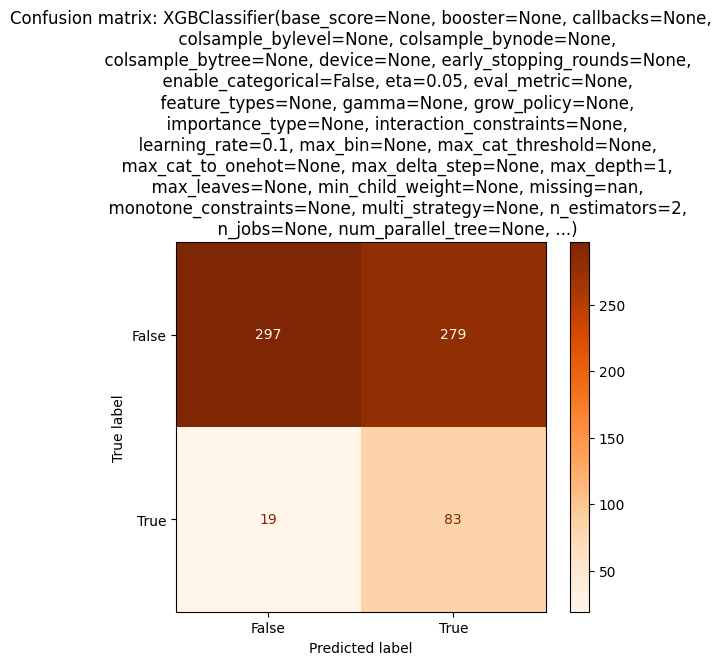

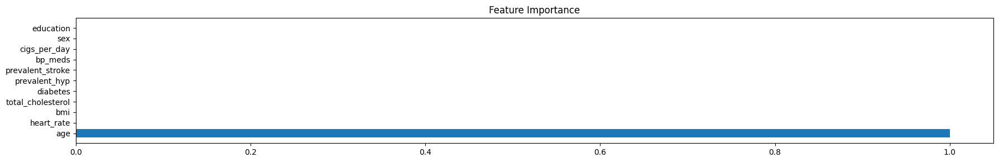

In [ ]:
#fitting the model
model(xgb_model,x_smote_scaled,y_smote,x_test_scaled,y_test)

###**Important values of XgBoost Classifier:**
* **Recall score of train dataset : 82.4%**
* **Recall score of test dataset : 81.4%**
* **False Negatives : 19**
* **Important Features : age**

#**Result**

In [ ]:
from prettytable import PrettyTable

# Specify the Column Names while initializing the Table
myTable = PrettyTable(["Model_Name",'False Negatives','Recall score of train set',"Recall score of test set"])

# Add rows
myTable.add_row(["Logistic Regression",'42',"70%",'59%'])
myTable.add_row(["K Nearest Neighbor Classifier","39","84%",'62%'])
myTable.add_row(["Naive Bayes Classifier","38","83%",'63%'])
myTable.add_row(["Decision Tree Classifier with GridSearchCV", "19","82%",'81%'])
myTable.add_row(["Support Vector Machine", "22","84%",'78%'])
myTable.add_row([" Random Forest with GridSearchCV", "0","100%",'100%'])
myTable.add_row(["XgBoost Classifier", "19","82%",'81%'])

print(myTable)

+--------------------------------------------+-----------------+---------------------------+--------------------------+
|                 Model_Name                 | False Negatives | Recall score of train set | Recall score of test set |
+--------------------------------------------+-----------------+---------------------------+--------------------------+
|            Logistic Regression             |        42       |            70%            |           59%            |
|       K Nearest Neighbor Classifier        |        39       |            84%            |           62%            |
|           Naive Bayes Classifier           |        38       |            83%            |           63%            |
| Decision Tree Classifier with GridSearchCV |        19       |            82%            |           81%            |
|           Support Vector Machine           |        22       |            84%            |           78%            |
|       Random Forest with GridSearchCV 

Here, we can see, **Random Forest with GridSearchCV, XgBoost Classifier, Decision Tree Classifier with GridSearchCV, Support Vector Machine** are giving us highest recall score i.e. less false negative. So we can deploy these model.

#**Model Explainability by LIME**

In [ ]:
#installing LIME
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=41d981e57a92aa70a8db971922b590df2efd1e3aec5746e8767f7e0aea042887
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
#Importing libraries
import lime
import lime.lime_tabular
from __future__ import print_function

In [ ]:
# Create the LIME Explainer
explainer = lime.lime_tabular.LimeTabularExplainer(feature_names = x.columns,
                                                  training_data = np.array(x_train),
                                                  mode='classification')

In [ ]:
# Get the explanation for RandomForest
exp = explainer.explain_instance(data_row = x_test.iloc[24], predict_fn = svm_model.predict_proba)
exp.show_in_notebook(show_table=True)

In [ ]:
# Get the explanation for RandomForest
exp = explainer.explain_instance(data_row = x_test.iloc[24], predict_fn = rf_model.predict_proba)
exp.show_in_notebook(show_table=True)

In [ ]:
# Get the explanation for RandomForest
exp = explainer.explain_instance(data_row = x_test.iloc[24], predict_fn = nb_model.predict_proba)
exp.show_in_notebook(show_table=True)

In [ ]:
# Get the explanation for RandomForest
exp = explainer.explain_instance(data_row = x_test.iloc[24], predict_fn = xgb_model.predict_proba)
exp.show_in_notebook(show_table=True)

In [ ]:
# Get the explanation for RandomForest
exp = explainer.explain_instance(data_row = x_test.iloc[24], predict_fn = xgb_model.predict_proba)
exp.show_in_notebook(show_table=True)

#**Summary and Conclusion:**


###**Steps which has been followed:**
* Handling null values by **dropping those rows which are null, by imputing values with Median & by using KNNImputer**.
* To reduce skewness, we have apply **Quantile based flooring and capping & square root function**.
* After that, I have checked multicollinearity using **Correlation map and Variance Inflation Factor** & dropped that features which have high VIF.
* then splitted the data for training and testing.
* then **resample the data using SMOTE technique**.
* then normalised the data using **StandardScaler** and built different model like Logistic Regression, Decision Tree Classifier using GridsearchCV, etc.

###**Exploratory data analysis:**
* **18%(269), 11%(118), 12%(70), 14%(54) of the patients belonging to the education level 1, 2, 3, 4 respectively were eventually diagnosed with CHD.**
* **Male patients have significantly higher risk of CHD 18%(272) than female patients 12%(239)**
* **Patients who smoke have significantly higher risk of CHD 16%(275) than patients who don't smoke 13%(236)**
* **Patients who take BP medicines have significantly higher risk of CHD 33%(33) than other patients 14%(478)**
* **Patients who had experienced a stroke in their life have significantly higher risk of CHD 45%(10) than other patients 14%(501)**
* **Hypertensive patients have significantly higher risk of CHD 23%(255) than other patients 11%(256)**
* **Diabetic patients have significantly higher risk of CHD 37%(33) than other patients 14%(478)**

###**recall score of test dataset:**
* **Logistic Regression: 42(59%)**
* **K nearest neighbors: 40(61%)**
* **Naive bayes: 38(63%)**
* **Decision tree with GridSearchCV: 19(81%)**
* **Support Vector Machine: 22(78%)**
* **Random Forest with GridSearchCV: 0(100%)**
* **XgBoost Classifier: 19(81%)**
      here we can see that, Decision Tree with GridSearchCV, Support Vector Machine, Random Forest with GridSearchCV gives the best recall score.

Q. why we are using recall score?
* Ans. Since we are dealing with data related to healthcare, False Negatives are of higher concern than False Positives. it doesn’t matter whether we raise a false alarm but the actual positive cases should not go undetected. it is decided that we use Recall as the model evaluation metric.  

###**Important Features:**
**features which predict CVD will occur:**
* total_cholestrol
* heart_rate
* cigs_per_day
* bp_meds
* diabetes
* age

**features which predict CVD will not occur:**
* education
* sex
* bmi
* prevalent_stroke
